In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/README_es.txt
/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/README_en.txt
/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/Dataset without augmentation/README.dataset.txt
/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/Dataset without augmentation/README.roboflow.txt
/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/Dataset without augmentation/data.yaml
/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection/Tomato leaf diseases dataset for Object Detection/Dataset without augmentation/valid/labels/V006_77_1_18_11_03_13_2_9605w_20200925_44_jpg.rf.0fae5065fe5010a95764d301901b524d.txt
/kaggle/input/tomato-lea

In [2]:
# ------------------------------------------------------------
# 1️⃣ Setup & Imports
# ------------------------------------------------------------
!pip install -q ultralytics ttach > /dev/null
import kagglehub
import os
import random
import yaml
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from ultralytics import YOLO

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.6 which is incompatible.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.3 which is incompatible.
mkl-umath 0.1.1 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
mkl-random 1.2.4 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
mkl-fft 1.3.8 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.
datasets 4.1.1 requires pyarrow>=21.0.0, but you have pyarrow 19.0.1 which is incompatible.
onnx 1.18.0 requires protobuf>=4.25.1, but you have protobuf 3.20.3 which is in

In [3]:
import shutil
import os

# Original read-only dataset path
src_path = "/kaggle/input/tomato-leaf-diseases-dataset-for-object-detection"

# Writable path for Kaggle session
dst_path = "/kaggle/working/tomato_dataset"

# Copy entire dataset to writable folder
if not os.path.exists(dst_path):
    shutil.copytree(src_path, dst_path)

print("Dataset copied to:", dst_path)

Dataset copied to: /kaggle/working/tomato_dataset


In [4]:
dataset_root = "/kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation"

for split in ['train', 'valid', 'test']:
    img_dir = os.path.join(dataset_root, split, 'images')
    lbl_dir = os.path.join(dataset_root, split, 'labels')
    assert os.path.exists(img_dir), f"Missing {img_dir}"
    assert os.path.exists(lbl_dir), f"Missing {lbl_dir}"
    print(f"📂 {split}: {len(os.listdir(img_dir))} images, {len(os.listdir(lbl_dir))} labels")

📂 train: 9730 images, 9730 labels
📂 valid: 659 images, 659 labels
📂 test: 420 images, 420 labels


In [5]:
#3️⃣ Fix & Save data.yaml
# ------------------------------------------------------------
yaml_path = os.path.join(dataset_root, "data.yaml")
with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

data_config['train'] = os.path.join(dataset_root, 'train', 'images')
data_config['val'] = os.path.join(dataset_root, 'valid', 'images')
data_config['test'] = os.path.join(dataset_root, 'test', 'images')

corrected_yaml = '/kaggle/working/data.yaml'
os.makedirs(os.path.dirname(corrected_yaml), exist_ok=True)
with open(corrected_yaml, 'w') as f:
    yaml.dump(data_config, f)

print("✅ Corrected data.yaml saved to:", corrected_yaml)

class_names = data_config["names"]
print(f"✅ Class names: {class_names}")

✅ Corrected data.yaml saved to: /kaggle/working/data.yaml
✅ Class names: ['Early Blight', 'Healthy', 'Late Blight', 'Leaf Miner', 'Leaf Mold', 'Mosaic Virus', 'Septoria', 'Spider Mites', 'Yellow Leaf Curl Virus']


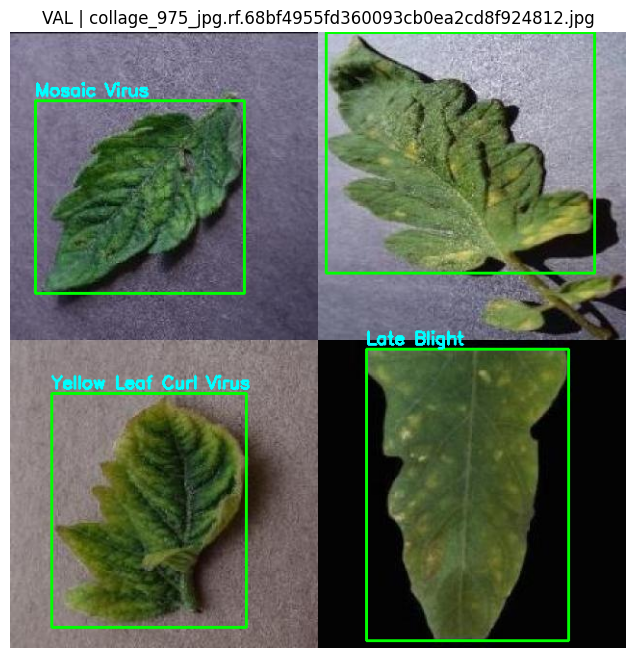

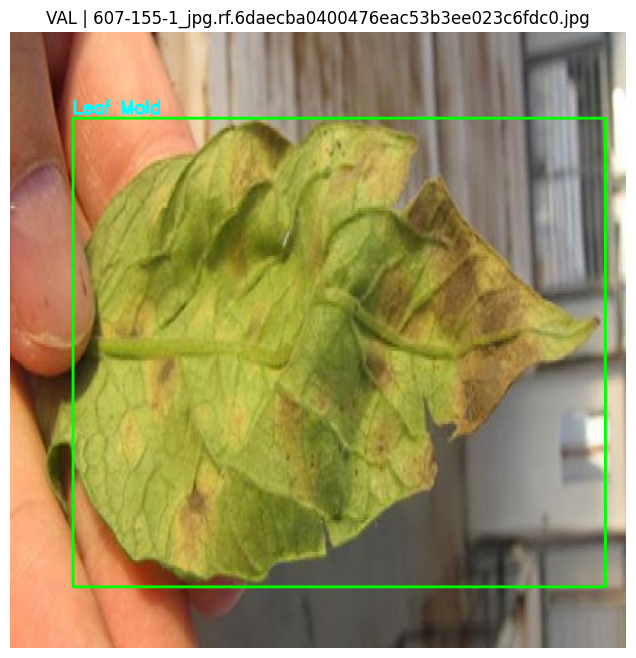

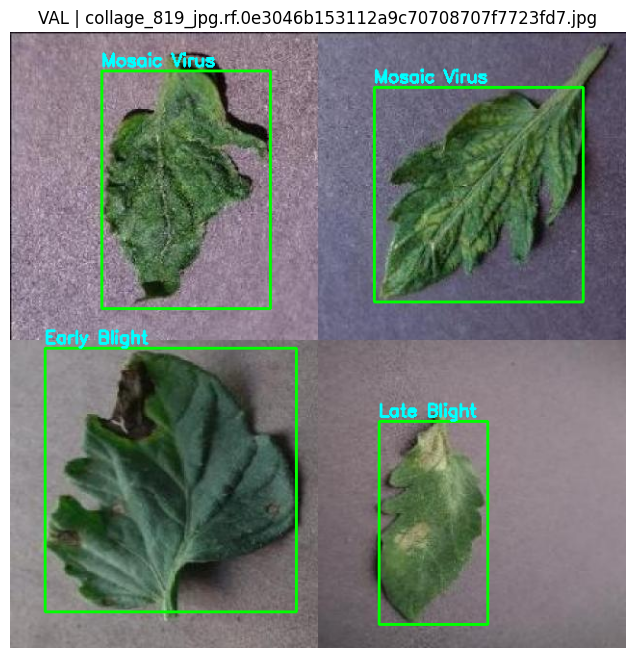

In [6]:
# ------------------------------------------------------------
# 4️⃣ YOLO Dataset Visualization
# ------------------------------------------------------------
def visualize_yolo_split(split_name, num_images=3):
    image_dir = Path(data_config[split_name])
    label_dir = image_dir.parent / "labels"

    img_files = list(image_dir.glob("*.jpg")) + list(image_dir.glob("*.png"))
    valid_imgs = [img for img in img_files if (label_dir / f"{img.stem}.txt").exists()]

    if not valid_imgs:
        print(f"⚠️ No labeled images found in {image_dir}")
        return

    random.shuffle(valid_imgs)
    for img_path in valid_imgs[:num_images]:
        label_path = label_dir / f"{img_path.stem}.txt"
        img = cv2.imread(str(img_path))
        h, w = img.shape[:2]

        with open(label_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) < 5: continue
                cls, x, y, bw, bh = map(float, parts[:5])
                cls = int(cls)
                x1, y1 = int((x - bw/2)*w), int((y - bh/2)*h)
                x2, y2 = int((x + bw/2)*w), int((y + bh/2)*h)
                cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
                cv2.putText(img, class_names[cls], (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,0), 2)

        plt.figure(figsize=(8,8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"{split_name.upper()} | {img_path.name}")
        plt.show()

visualize_yolo_split("val", num_images=3)

In [7]:
# ------------------------------------------------------------
# 5️⃣ Train YOLOv11n Model
# ------------------------------------------------------------

model = YOLO("yolo11n.pt")  # pre-trained model

results = model.train(
    data=str(yaml_path),
    epochs=50,
    imgsz=640,
    batch=16,
    project="/kaggle/working/tomato_yolov11_train",
    name="yolov12_tomato",
    device=0,
    workers=2,
    exist_ok=True
)

print("\n✅ Training complete. Best model saved in:")
print(model.ckpt_path)

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov12_tomato, nbs=64, nms=False, opset=N

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        659       1785      0.914      0.871      0.942       0.85
          Early Blight        134        163      0.913      0.901      0.955      0.872
               Healthy         91        288      0.875      0.896      0.933      0.831
           Late Blight        115        175      0.928      0.891      0.957      0.877
            Leaf Miner        127        174      0.958      0.989      0.992      0.918
             Leaf Mold        106        215      0.915      0.758      0.915      0.812
          Mosaic Virus        152        186      0.926      0.878      0.948      0.901
              Septoria        104        196      0.911      0.839      0.932      0.842
          Spider Mites         76        205      0.951      0.956      0.984       0.91
Yellow Leaf Curl Virus         64        183      0.843      0.727      0.858      0.686
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /kaggle/wor

In [8]:
# ------------------------------------------------------------
# 6️⃣ Evaluate the trained model
# ------------------------------------------------------------

# Load the best model
best_model_path = "/kaggle/working/tomato_yolov11_train/yolov12_tomato/weights/best.pt"
best_model = YOLO(best_model_path)

# Run validation on the test set
metrics = best_model.val(
    data=corrected_yaml,
    split='test',   # evaluate on test set
    imgsz=640,
    batch=16,
    device=0,
    workers=2
)

# Use results_dict to get metrics
results_dict = metrics.results_dict  # correct attribute
precision = results_dict.get('metrics/precision(B)', 0)
recall = results_dict.get('metrics/recall(B)', 0)
mAP50 = results_dict.get('metrics/mAP50(B)', 0)
mAP5095 = results_dict.get('metrics/mAP50-95(B)', 0)
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print("\n✅ Evaluation Metrics:")
print(f"mAP@0.5: {mAP50:.4f}")
print(f"mAP@0.5:0.95: {mAP5095:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 805.5±176.4 MB/s, size: 54.7 KB)
val: Scanning /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/labels... 420 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 420/420 1.4Kit/s 0.3s
val: New cache created: /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 6.3it/s 4.3s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        420       1578      0.979      0.957      0.985      0.948
          Early Blight        135        162      0.993      0.934      0.988      0.966
               Healthy         57        108      0.924      0.898      0.946      0.849
           Late Blight        189        261      0.992      0.992      0.993      0.964
            Leaf Miner        122        146          1          1      0.995      0.956
             Leaf Mold        168        222      0.964      0.932      0.984      0.948
          Mosaic Virus        172        220          1      0.941      0.991      0.961
              Septoria        143        174      0.997          1      0.995      0.982
          Spider Mites         98        111      0.988      0.991      0.994      0.985
Yellow Leaf Curl Virus        116        174      0.948      0.925      0.978      0.922
Speed: 1.8ms preprocess, 3.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/wor

Displaying training and validation metrics...


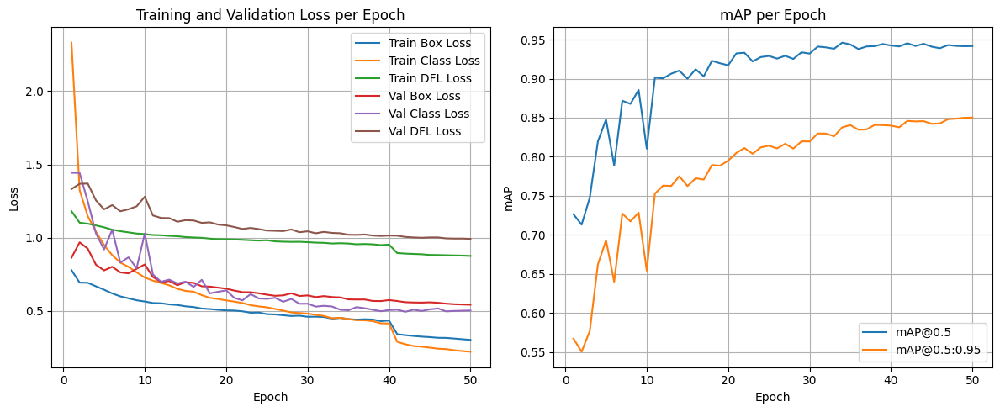


✅ Metric display complete.


In [9]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 7️⃣ Display training and validation metrics
# ------------------------------------------------------------
print("Displaying training and validation metrics...")

# Path to YOLO training results
results_path = os.path.join("/kaggle/working/tomato_yolov11_train", "yolov12_tomato", "results.csv")

if os.path.exists(results_path):
    results_df = pd.read_csv(results_path)

    # Plot training and validation loss
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(results_df['epoch'], results_df['train/box_loss'], label='Train Box Loss')
    plt.plot(results_df['epoch'], results_df['train/cls_loss'], label='Train Class Loss')
    plt.plot(results_df['epoch'], results_df['train/dfl_loss'], label='Train DFL Loss')
    plt.plot(results_df['epoch'], results_df['val/box_loss'], label='Val Box Loss')
    plt.plot(results_df['epoch'], results_df['val/cls_loss'], label='Val Class Loss')
    plt.plot(results_df['epoch'], results_df['val/dfl_loss'], label='Val DFL Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss per Epoch')
    plt.legend()
    plt.grid(True)

    # Plot mAP
    plt.subplot(1, 2, 2)
    plt.plot(results_df['epoch'], results_df['metrics/mAP50(B)'], label='mAP@0.5')
    plt.plot(results_df['epoch'], results_df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.title('mAP per Epoch')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

else:
    print(f"⚠️ Results file not found at {results_path}. Cannot display plots.")

print("\n✅ Metric display complete.")

🔍 Showing 5 random test predictions from YOLOv11...


image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_126_jpg.rf.8c77c8fa7fcef7fc14d5363dfd809d90.jpg: 640x640 1 Early Blight, 1 Late Blight, 1 Leaf Miner, 1 Yellow Leaf Curl Virus, 10.3ms
Speed: 1.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


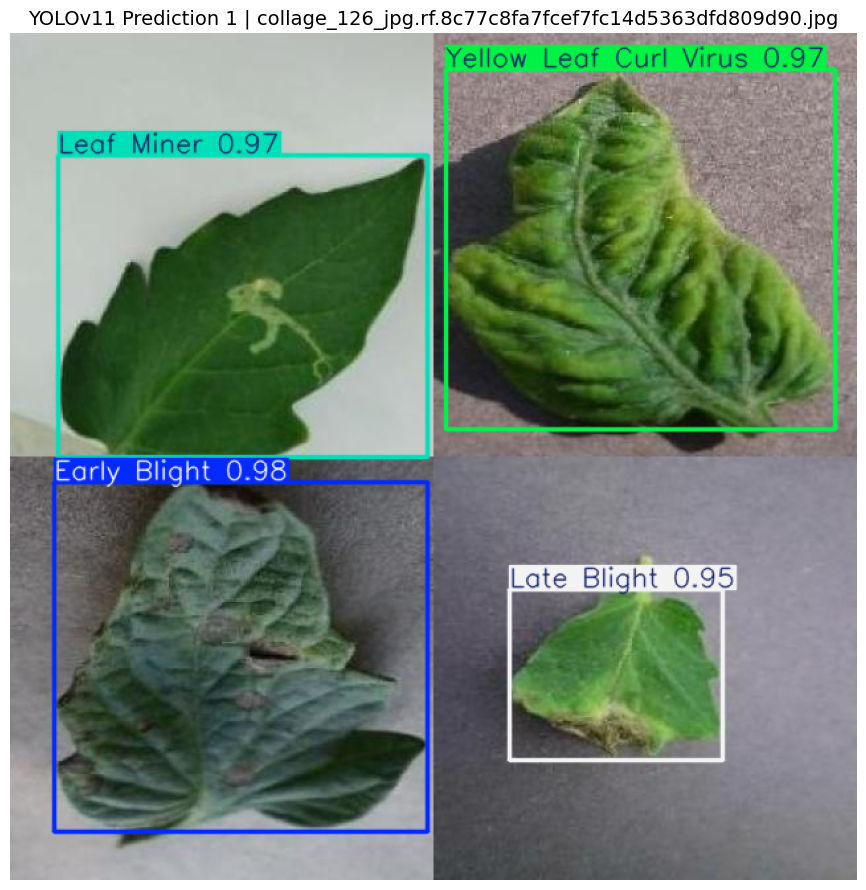


image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_1027_jpg.rf.a08a3208095f5859f9b22488a34f119b.jpg: 640x640 1 Leaf Mold, 1 Mosaic Virus, 2 Septorias, 9.9ms
Speed: 1.6ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


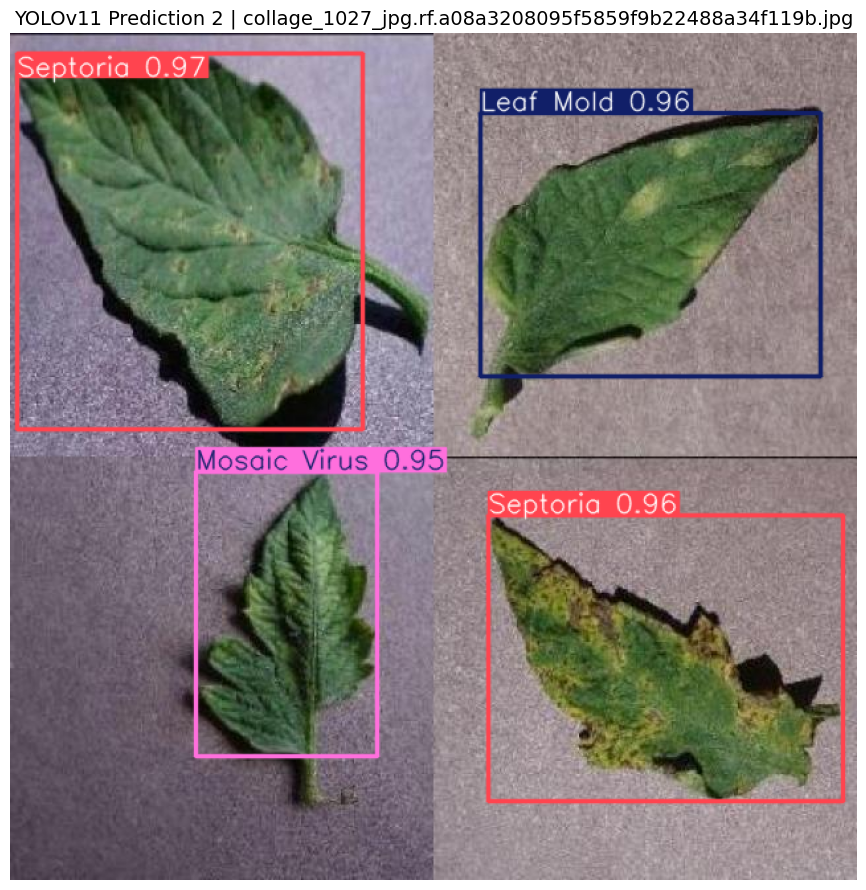


image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_106_jpg.rf.4cbc225bdeb50f25278cd101a910c7d0.jpg: 640x640 1 Leaf Miner, 1 Leaf Mold, 1 Mosaic Virus, 1 Spider Mites, 9.6ms
Speed: 1.6ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


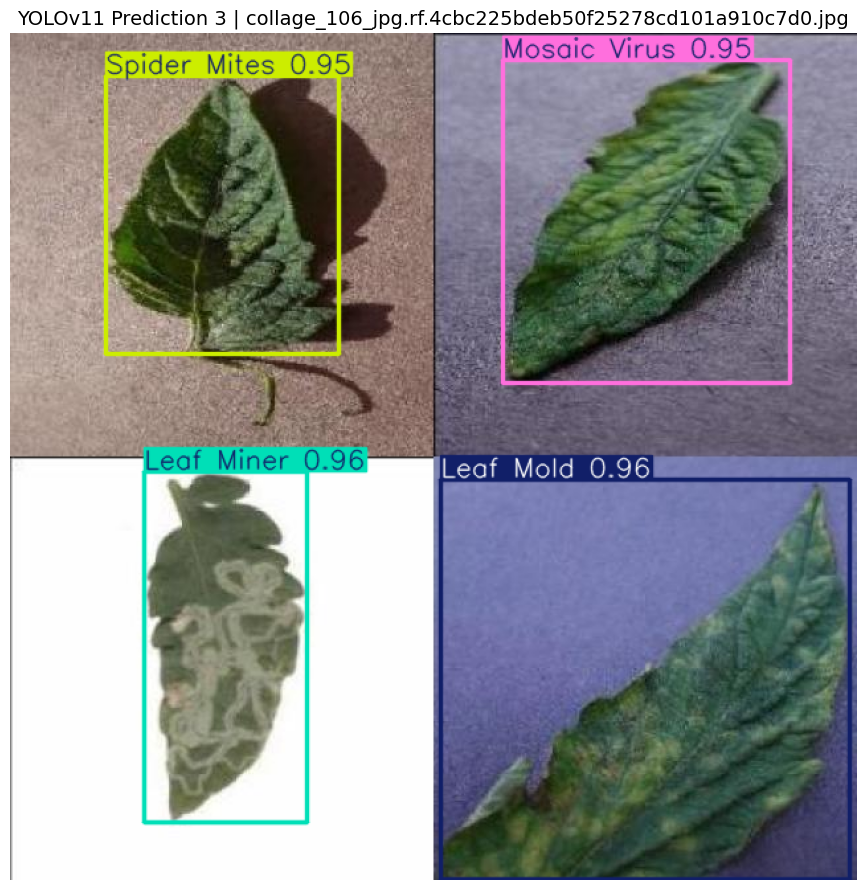


image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/concentric-rings-with-chlorotic-and-necrotic-patches_jpg.rf.1fb3e156788eb59985f33a6894015322.jpg: 640x640 1 Early Blight, 9.1ms
Speed: 1.6ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


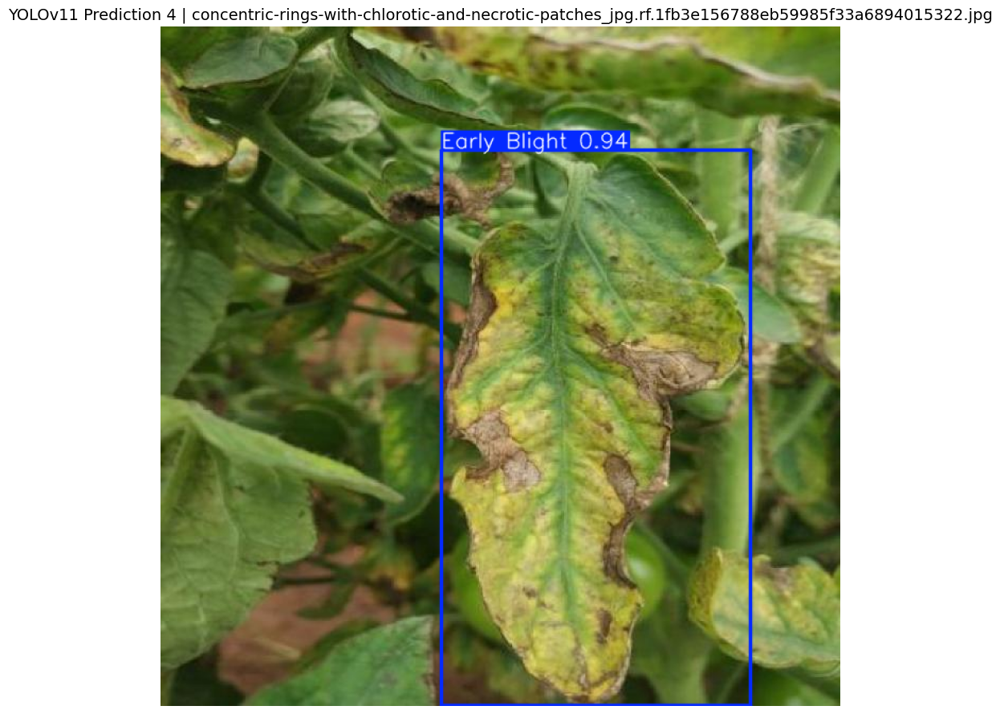


image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_39_jpg.rf.652516ca0c7275ef791959d5762e2c89.jpg: 640x640 1 Late Blight, 1 Mosaic Virus, 1 Spider Mites, 1 Yellow Leaf Curl Virus, 12.5ms
Speed: 1.8ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


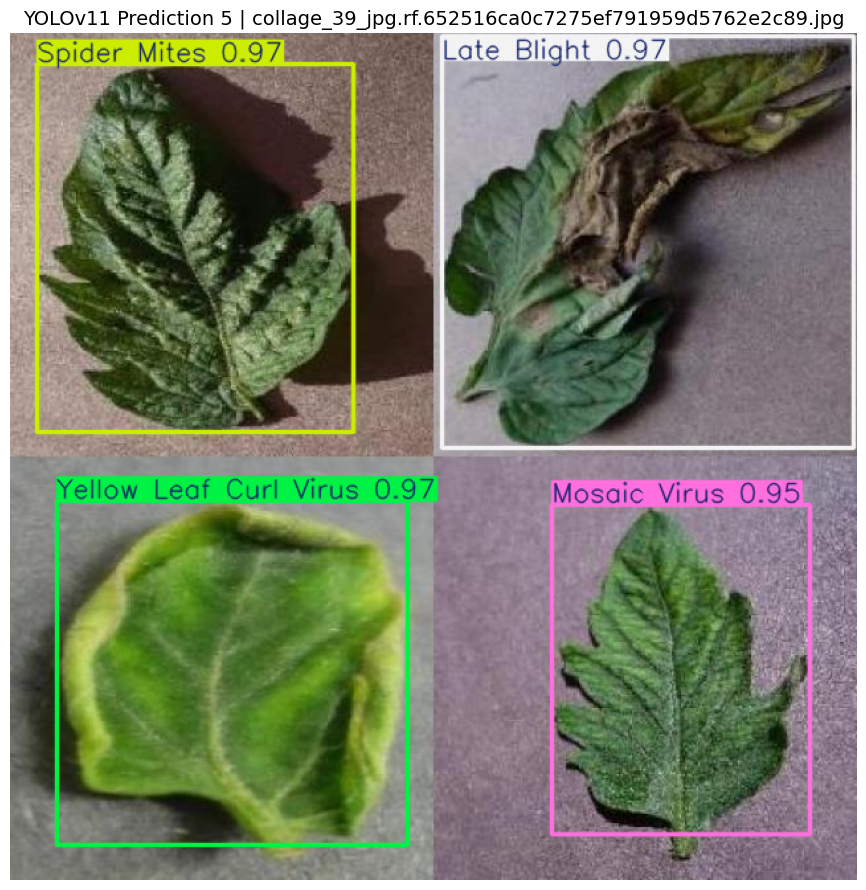

In [10]:
# ------------------------------------------------------------
# 8️⃣ Visualize 5 Random Test Predictions
# ------------------------------------------------------------
import random
from pathlib import Path

# Get test image paths
test_img_dir = Path(dataset_root) / "test" / "images"
test_images = list(test_img_dir.glob("*.jpg")) + list(test_img_dir.glob("*.png"))

# Ensure we have enough images
num_samples = min(5, len(test_images))
random.seed(42)  # for reproducibility
sample_images = random.sample(test_images, num_samples)

print(f"🔍 Showing {num_samples} random test predictions from YOLOv11...\n")

for i, img_path in enumerate(sample_images):
    # Run inference
    results = best_model(img_path)
    
    # Plot with bounding boxes, labels, and confidence (built into YOLO)
    plotted_img = results[0].plot()  # Returns BGR numpy array
    
    # Display
    plt.figure(figsize=(9, 9))
    plt.imshow(cv2.cvtColor(plotted_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"YOLOv11 Prediction {i+1} | {img_path.name}", fontsize=14)
    plt.tight_layout()
    plt.show()

🎯 Found examples for 9 / 9 classes.

image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/039b47d574bc4bb8a14259a1cd96a741_jpg.rf.71ea2112b30a2e2f33839ed9c69aa151.jpg: 640x640 1 Septoria, 9.5ms
Speed: 1.8ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_1025_jpg.rf.f2a57a92c53d02004f2abaea044d63f3.jpg: 640x640 1 Healthy, 1 Late Blight, 1 Leaf Mold, 1 Mosaic Virus, 1 Septoria, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/tomato_dataset/Tomato leaf diseases dataset for Object Detection/Dataset with augmentation/test/images/collage_1074_jpg.rf.984c9ce76aa101cb170587bdfe7fdcf9.jpg: 640x640 2 Late Blights, 1 Leaf Mold, 1 Septoria, 8.9ms
Speed: 1.5ms preprocess, 8

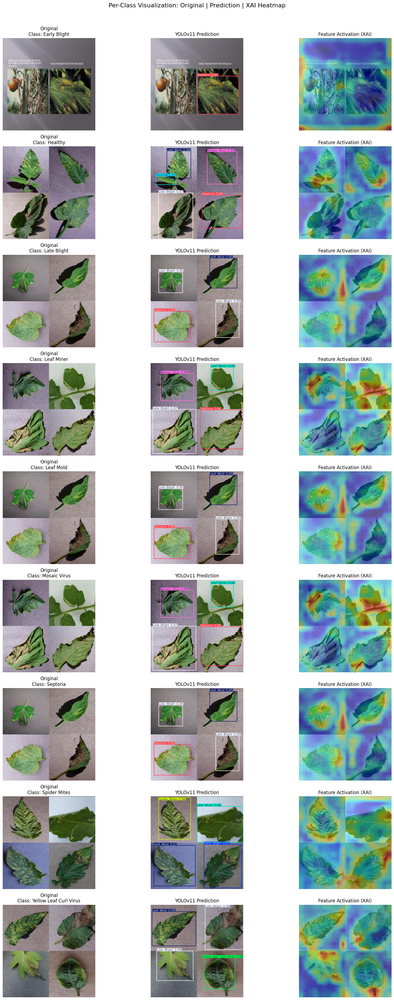

In [11]:
# ------------------------------------------------------------
# 9️⃣ Explainability: Feature Activation Map (XAI)
# ------------------------------------------------------------
# ------------------------------------------------------------
# 🔍 XAI: One Example Per Class + Side-by-Side Comparison
# ------------------------------------------------------------
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from collections import defaultdict

# Get all test images and their labels
test_img_dir = Path(dataset_root) / "test" / "images"
test_lbl_dir = Path(dataset_root) / "test" / "labels"

# Build mapping: class_id -> list of (img_path, bbox)
class_to_examples = defaultdict(list)

for lbl_path in test_lbl_dir.glob("*.txt"):
    img_path = test_img_dir / f"{lbl_path.stem}.jpg"
    if not img_path.exists():
        img_path = test_img_dir / f"{lbl_path.stem}.png"
    if not img_path.exists():
        continue

    with open(lbl_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls_id = int(float(parts[0]))
            # Store first bbox per image per class (simplification)
            if len(class_to_examples[cls_id]) < 1:  # only 1 example per class
                class_to_examples[cls_id].append((img_path, list(map(float, parts))))

# Sort by class ID for consistent order
examples_per_class = [class_to_examples[i][0] for i in range(len(class_names)) if i in class_to_examples]

print(f"🎯 Found examples for {len(examples_per_class)} / {len(class_names)} classes.")

# Feature map extraction function (same as before)
def get_activation_overlay(model, img_path, layer_idx=-3):
    model.model.eval()
    img = cv2.imread(str(img_path))
    if img is None:
        raise ValueError(f"Could not load image: {img_path}")
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    input_tensor = cv2.resize(img_rgb, (640, 640))
    input_tensor = torch.from_numpy(input_tensor).float().permute(2,0,1).unsqueeze(0).to(model.device) / 255.0

    activation = {}
    def hook(m, inp, out): activation['feat'] = out.detach()
    target_layer = list(model.model.model.children())[layer_idx]
    handle = target_layer.register_forward_hook(hook)
    
    with torch.no_grad():
        _ = model.model(input_tensor)
    handle.remove()
    
    feat = activation['feat'].cpu().mean(dim=1).squeeze().numpy()
    feat = (feat - feat.min()) / (feat.max() - feat.min() + 1e-8)
    feat = cv2.resize(feat, (w, h))
    heatmap = cv2.applyColorMap(np.uint8(255 * feat), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)
    return img, overlay

# Plot one row per class
plt.figure(figsize=(18, 4 * len(examples_per_class)))

for idx, (img_path, label_parts) in enumerate(examples_per_class):
    cls_id = int(label_parts[0])
    class_name = class_names[cls_id]

    # 1. Original image
    orig_img = cv2.imread(str(img_path))
    orig_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    # 2. Prediction with bounding box
    pred_result = best_model(img_path)[0]
    pred_img = pred_result.plot()  # BGR
    pred_rgb = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)

    # 3. Activation map
    _, activation_overlay = get_activation_overlay(best_model, img_path)

    # Plot all three side-by-side
    plt.subplot(len(examples_per_class), 3, idx * 3 + 1)
    plt.imshow(orig_rgb)
    plt.title(f"Original\nClass: {class_name}", fontsize=12)
    plt.axis("off")

    plt.subplot(len(examples_per_class), 3, idx * 3 + 2)
    plt.imshow(pred_rgb)
    plt.title(f"YOLOv11 Prediction", fontsize=12)
    plt.axis("off")

    plt.subplot(len(examples_per_class), 3, idx * 3 + 3)
    plt.imshow(cv2.cvtColor(activation_overlay, cv2.COLOR_BGR2RGB))
    plt.title("Feature Activation (XAI)", fontsize=12)
    plt.axis("off")

plt.tight_layout()
plt.suptitle("Per-Class Visualization: Original | Prediction | XAI Heatmap", y=1.02, fontsize=16)
plt.show()